In [1]:
import numpy as np
import IPython.display as ipd
import matplotlib.pyplot as plt
import scipy as sp
pi = np.pi

1.0

In [3]:
def plotter(voice, fs):
    n = np.arange(len(voice))/fs
    plt.plot(n, voice)


In [4]:
def plotter_legend(voice, fs, string):
    n = np.arange(len(voice))/fs
    plt.plot(n, voice, label=string)
    plt.legend()
    
  

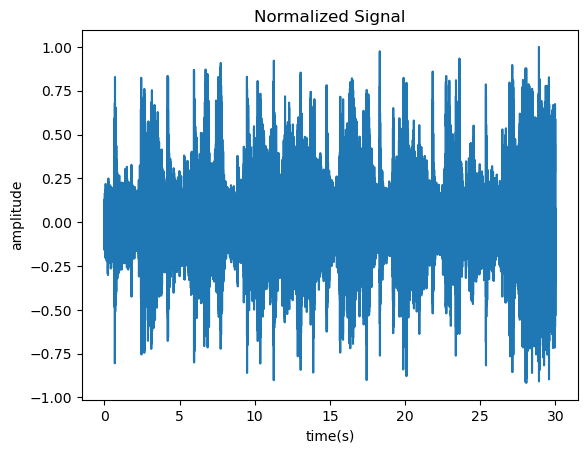

In [ ]:
fs, signal = sp.io.wavfile.read(r"C:\Users\yourfile")
normal = signal/np.max(np.abs(signal))
plotter(normal, fs)
plt.title('Normalized Signal')
plt.xlabel('time(s)')
plt.ylabel('amplitude')
size = len(normal)
ipd.Audio(data = signal, rate = fs)


In [6]:
windows = []
step = 512
hann = np.hanning(step)
for i in range(0, size, step):
    xi = normal[i:i+step]
    if len(xi) < step:
        z = np.zeros(step-len(xi))
        xi = np.concatenate((xi, z))
    win = xi*hann
    windows.append(win)

windows = np.array(windows)
Nw = len(windows)

1.1

In [8]:
def b(f):
    return 13*np.arctan(0.00076*f) + 3.5*np.arctan((f/7500)**2)
    

In [9]:
N = 512
N2 = N//2
def spectral_density(win):
    PN = 90.302
    sp = np.fft.fft(win, N)
    sp = sp[:N//2]
    res = PN + 10*np.log10(np.abs(sp)**2 + 1e-12)
    return res

Text(0, 0.5, 'Power Spectral Density (SPL)')

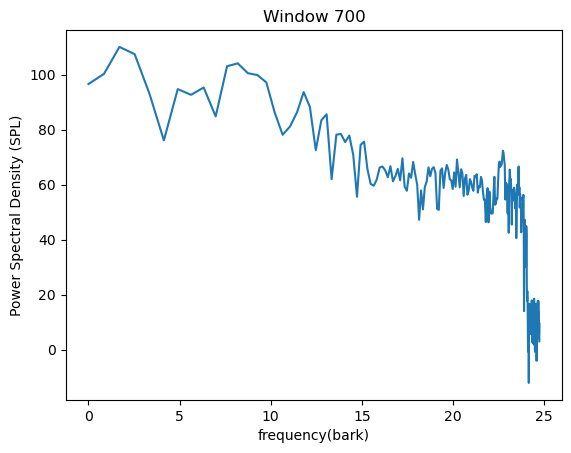

In [11]:
P = [spectral_density(w) for w in windows]
f = np.linspace(0, fs//2, N2)
bark = b(f)
plt.plot(bark, P[700])
plt.title('Window 700')
plt.xlabel('frequency(bark)')
plt.ylabel('Power Spectral Density (SPL)')

1.2

In [13]:
def Dk(k):
    res = [2]
    if(63 <= k):
        res.append(3)
    if(127 <= k):
        for i in range(4, 7):
            res.append(i)
    return res    

In [14]:
def St(win, k):
    if(k<2 or k>=250):
        return False
    x1 = (P[win][k] > P[win][k+1]) and (P[win][k] > P[win][k-1]) 
    for dk in Dk(k):
        x1 = x1 and ((P[win][k]>P[win][k+dk] + 7) and (P[win][k]>P[win][k-dk] + 7))
    return x1
    
    

In [ ]:
P_TM = []
for w in range(Nw):
    temp = np.zeros(N2)
    for k in range(N2):
        if(St(w,k)): 
            temp[k] = 10*np.log10(10**(0.1*P[w][k-1]) + 10**(0.1*P[w][k]) + 10**(0.1*P[w][k+1]))
    temp = np.array(temp)
    P_TM.append(temp)

P_TM = np.array(P_TM)
P_NM = np.load(r"C:\Users\noisemasks_file")
P_NM = np.transpose(P_NM)


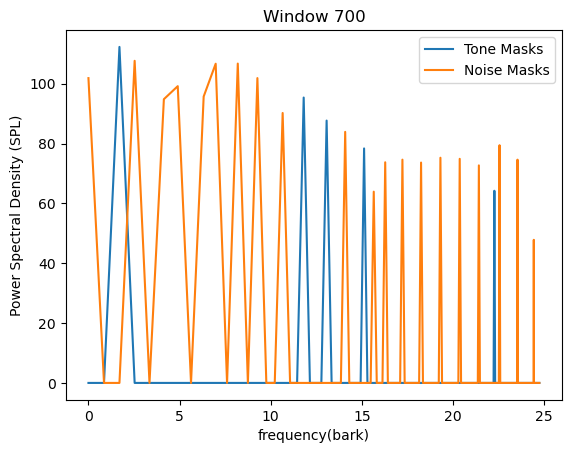

In [16]:
plt.plot(bark, P_TM[700], label='Tone Masks')
plt.plot(bark, P_NM[700], label ='Noise Masks')
plt.title('Window 700')
plt.xlabel('frequency(bark)')
plt.ylabel('Power Spectral Density (SPL)')
plt.legend()


1.3

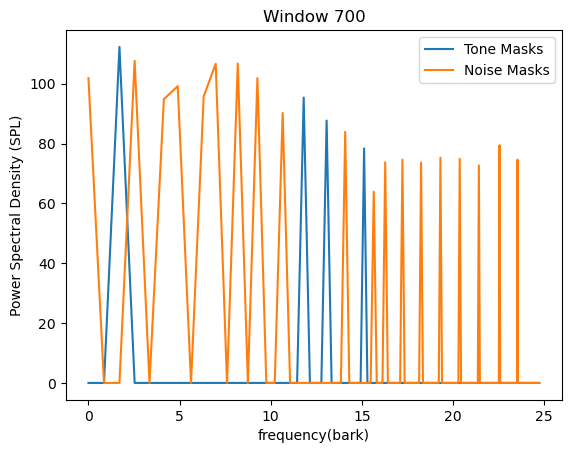

In [18]:
P_TMc = np.load(r"C:\Users\tspen\Documents\DSP25_LabProject2_Material\P_TMc-25.npy")
P_NMc = np.load(r"C:\Users\tspen\Documents\DSP25_LabProject2_Material\P_NMc-25.npy")
P_NMc = np.transpose(P_NMc)
P_TMc = np.transpose(P_TMc)
plt.plot(bark, P_TMc[700], label ='Tone Masks')
plt.plot(bark, P_NMc[700], label ='Noise Masks')
plt.title('Window 700')
plt.xlabel('frequency(bark)')
plt.ylabel('Power Spectral Density (SPL)')
plt.legend()

1.4

In [22]:
def SF(w, i, j, t):
    Db = bark[i] - bark[j]
    if(Db >= -3 and Db < -1):
        res = 17*Db - 0.4*t +11
    elif(Db >= -1 and Db < 0):
        res = (0.4*t + 6)*Db
    elif(Db >= 0 and Db < 1):
        res = -17*Db
    elif(Db >= 1 and Db < 8):
        res = (0.15*t - 17)*Db - 0.15*t
    else:
        res = -np.inf
    return res

In [23]:
T_TM = []
T_NM = []
for w in range(Nw):
    
    temp1 = np.full((N2, N2), -np.inf)
    temp2 = np.full((N2, N2), -np.inf)

    for j in range(N2):
        if P_TMc[w][j] > 0:
            for i in range(N2):
                if (bark[i] >= bark[j] - 3) and (bark[i] <= bark[j] + 8):
                    temp1[i][j] = P_TMc[w][j] - 0.275 * bark[j] + SF(w, i, j, P_TMc[w][j]) - 6.025
        if P_NMc[w][j] > 0:
            for i in range(N2):
                if bark[i] >= bark[j] - 3 and bark[i] <= bark[j] + 8:
                    temp2[i][j] = P_NMc[w][j] - 0.175 * bark[j] + SF(w, i, j, P_NMc[w][j]) - 2.025 
    T_TM.append(temp1)
    T_NM.append(temp2)
    

1.5

In [25]:
def T_q(fhz):
    t = fhz/1000
    return 3.65*(t**(-0.8)) - 6.5*np.exp(-0.6*((t-3.3)**2)) + 0.001*(t**4)

In [26]:
f = np.linspace(0, fs//2, 256)

Tq = T_q(f)

C:\Users\tspen\AppData\Local\Temp\ipykernel_21376\3536571510.py:3: RuntimeWarning: divide by zero encountered in power
  return 3.65*(t**(-0.8)) - 6.5*np.exp(-0.6*((t-3.3)**2)) + 0.001*(t**4)


In [27]:
Tg = []

for w in range(Nw):
    temp = np.zeros(N2)
    for i in range(N2):
        t1 = np.sum(10**(0.1*T_TM[w][i]))
        t2 = np.sum(10**(0.1*T_NM[w][i]))
        t3 = 10**(0.1*Tq[i])
        t = 10*np.log10(t1+t2+t3)
        temp[i] = t
    Tg.append(temp)
Tg = np.array(Tg)

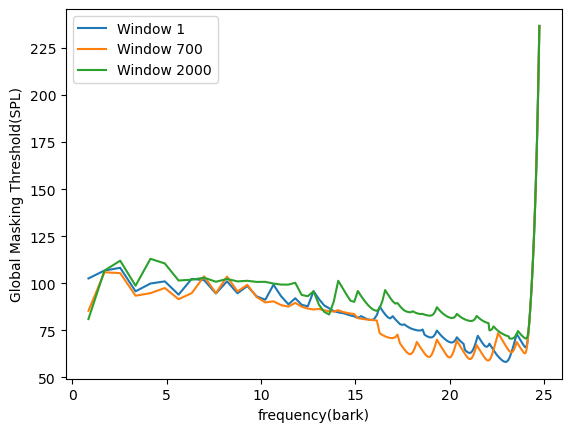

In [28]:
Tg = np.array(Tg)
plt.plot(bark, Tg[1], label='Window 1')
plt.plot(bark, Tg[700], label='Window 700')
plt.plot(bark, Tg[2000], label='Window 2000')
plt.xlabel('frequency(bark)')
plt.ylabel('Global Masking Threshold(SPL)')
plt.legend()

2o Mέρος

2.0

In [39]:
x = []
step = 512
for i in range(0, size, step):
    xi = signal[i:i+step]
    if len(xi) < step:
        z = np.zeros(step-len(xi))
        xi = np.concatenate((xi, z))
    x.append(xi)
x = np.array(x)
Nx = len(x)
bits_initial = step * Nx * 16

In [40]:
def sin_win(n, k, M):
    h = np.sin((n+0.5)*(pi/(2*M)))*np.sqrt(2/M)*np.cos(((2*n+M+1)*(2*k+1)*pi)/(4*M))
    return h

In [41]:
M = 32
L = 2*M
n = np.arange(L)
n2 = 2*M - 1 - n
h = []
g = []
for k in range(M):
    th = sin_win(n, k, M)
    tg = sin_win(n2, k, M)
    h.append(th)
    g.append(tg)

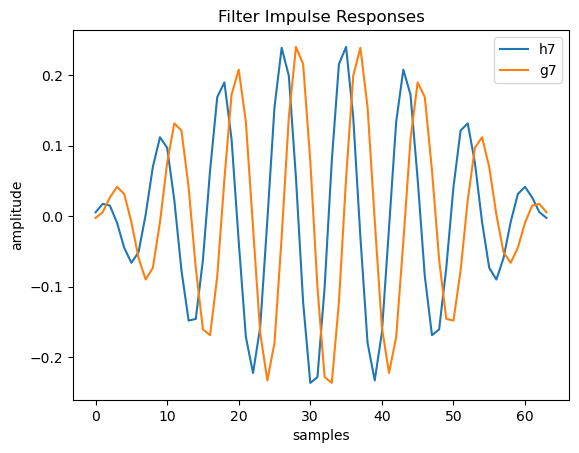

In [45]:
plt.plot(n, h[7], label='h7')
plt.plot(n, g[7], label='g7')
plt.title('Filter Impulse Responses')
plt.xlabel('samples')
plt.ylabel('amplitude')
plt.legend()

2.1 Filter with h and down-sample

In [47]:
def conv_dec(x, h, M):
    y = []
    u = []
    for k in range(M):
        temp = sp.signal.convolve(x, h[k])
        temp2 = temp[::M]
        u.append(temp)
        y.append(temp2)
    u = np.array(u)
    y = np.array(y)
    return u, y

2.2 Quantize

In [49]:
def quant(s, D, mv = np.min(signal)):
    return mv + D*np.round((s-mv)/D)

2.3 Up-sample and filter with g

In [51]:
def int_conv(yq, g, M):
    w = []
    what = []
    for i in range(M):
        t = np.zeros(len(yq[i])*M)
        t[::M] = yq[i]
        w.append(t)
        t2 = sp.signal.convolve(w[i], g[i])
        what.append(t2)
    what = np.array(what)
    w = np.array(w)
    xr = np.sum(what, axis=0).astype(np.int16)
    return xr, what, w

Compression Rate

In [53]:
def compr_rate(bits_initial, bits_final):
    return 1- bits_final/bits_initial

Function for adaptive quantizer

In [55]:
def compress1(x, h, g, Tg, M, win):
    #2.1 filterbank
    u, y = conv_dec(x, h, M)
    #plots
    if(win == 700):
        i = 7
        plt.figure()
        plotter_legend(u[7], fs, 'u7')
        plotter_legend(y[7], fs/M, 'y7')
        plt.title('Window 700')
        plt.xlabel('time(s)')
        plt.ylabel('amplitude')
       

    #2.2 quantize
    index = [round((2*k-1)*N/(4*M)) for k in range(1,M+1)]
    A = N//(4*M)
    R = 2**(signal.itemsize * 8)
    bits = np.zeros(M, dtype= np.int16)
    Delta = np.zeros(M)
    yq = []
    for i in range(M):
        d = np.min(Tg[(index[i]-A):(index[i]+A)])
        bits[i] = np.int16(np.log2(R/d)-1)
        Delta[i] = (np.max(y[i]) - np.min(y[i])) / (2**bits[i])
        t = quant(y[i], Delta[i], np.min(y[i]))
        yq.append(t)
    yq = np.array(yq)
   
    
    #plots
    if(win == 700):
        i = 7
        plt.figure()
        plotter_legend(y[i], fs/M, 'y7')
        plotter_legend(yq[i], fs/M, 'yq7')
        plt.title('Window 700')
        plt.xlabel('time(s)')
        plt.ylabel('amplitude')

    #2.3 synthesis
    xr, what, w = int_conv(yq, g, M)

    
    #plots
    if(win == 700):
        i = 7
        plt.figure()
        plotter_legend(u[i], fs, 'u7')
        plotter_legend(w[i], fs, 'w7')
        plt.title('Window 700')
        plt.xlabel('time(s)')
        plt.ylabel('amplitude')

        i = 7
        plt.figure()
        plotter_legend(y[i], fs/M, 'y7')
        plotter_legend(yq[i], fs/M, 'yq7')
        plotter_legend(w[i], fs, 'w7')
        plt.title('Window 700')
        plt.xlabel('time(s)')
        plt.ylabel('amplitude')


    return xr, bits

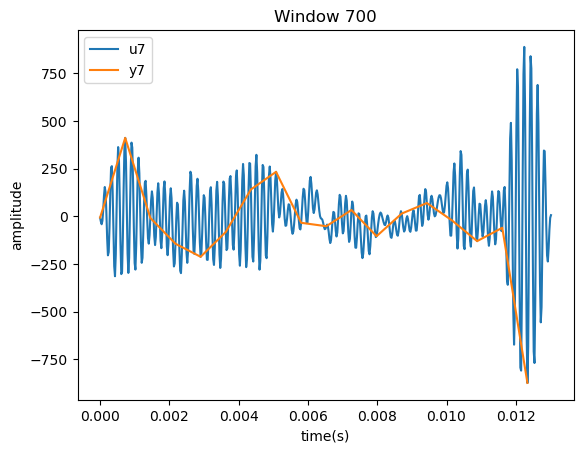

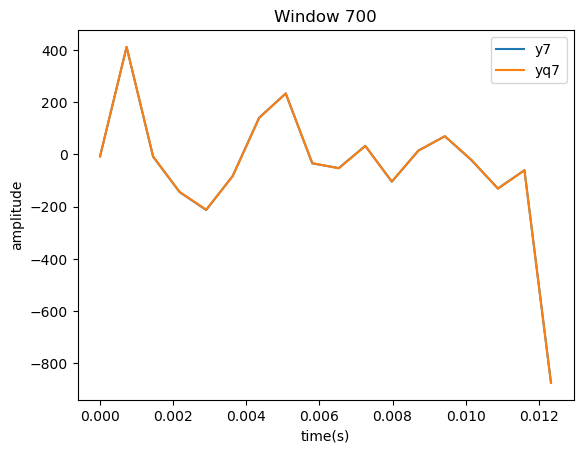

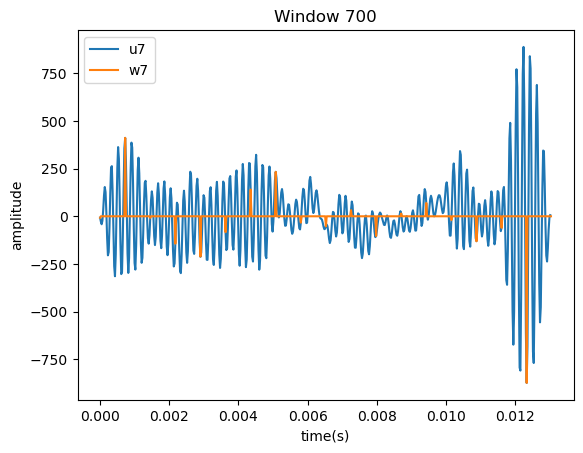

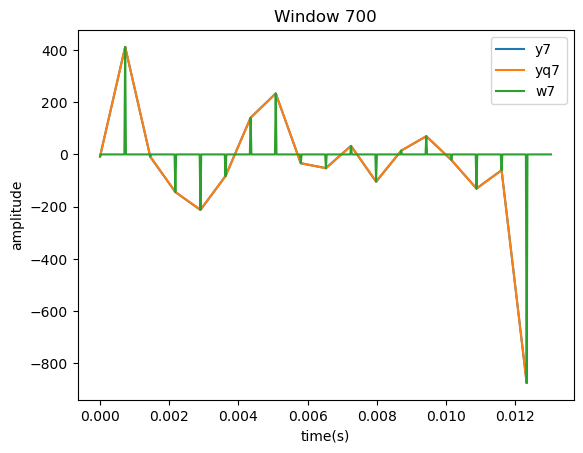

In [56]:
xr1 = []
Bk1 = []
bits_final1 = 0
for win in range(Nx):
    xwinr, b = compress1(x[win], h, g, Tg[win], M, win)
    for i in range(M):
        bits_final1 += (step/M)* b[i]
    xr1.append(xwinr)
    Bk1.append(b)
xr1 = np.array(xr1)

Overlap Add for 1st case

The compression rate using the adaptive compressor is 0.5017596265479876
The MSE using the adaptive compressor is 340.47830007558576


Text(0, 0.5, 'amplitude')

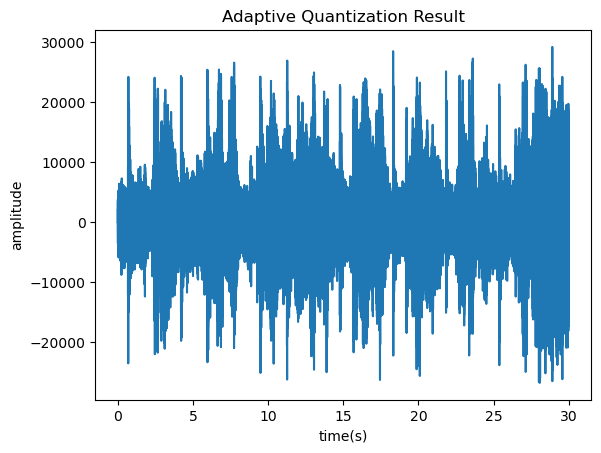

In [59]:
step = N
ola = len(xr1[0])
final1 = np.zeros(Nx*step+len(g[0])+len(h[0]), dtype=np.int16)
for win in range(Nx):
    final1[win*step:win*step+ola] += xr1[win]
final1.astype(np.int16)


print("The compression rate using the adaptive compressor is",compr_rate(bits_initial, bits_final1))
#MSE
start = 63
end = start+len(signal)
mse1 = np.mean((final1[start:end]-signal)**2)
print("The MSE using the adaptive compressor is",mse1)
plt.figure()
plotter(final1, fs)
plt.title("Adaptive Quantization Result")
plt.xlabel('time(s)')
plt.ylabel('amplitude')

Text(0, 0.5, 'amplitude')

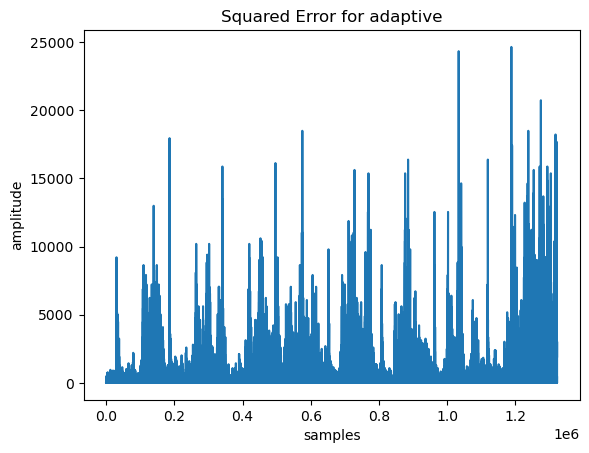

In [61]:
plt.plot((final1[start:end]-signal)**2)
plt.title('Squared Error for adaptive')
plt.xlabel('samples')
plt.ylabel('amplitude')

Text(0, 0.5, 'amplitude')

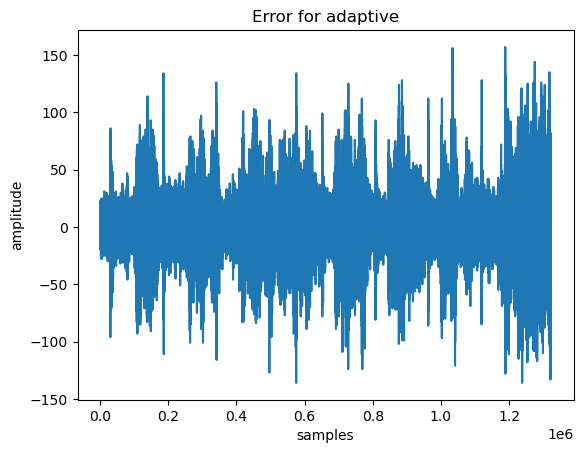

In [62]:
plt.plot(final1[start:end]-signal)
plt.title('Error for adaptive')
plt.xlabel('samples')
plt.ylabel('amplitude')

In [63]:
sp.io.wavfile.write("reconstructed_1.wav", fs, final1)

Function for non-adaptive quantizer

In [67]:
def compress2(x, h, g, Tg, M, win):
    #2.1 filterbank
    u, y = conv_dec(x, h, M)
    #plots
    if(win == 700):
        i = 7
        plt.figure()
        plotter_legend(u[7], fs, 'u7')
        plotter_legend(y[7], fs/M, 'y7')
        plt.title('Window 700')
        plt.xlabel('time(s)')
        plt.ylabel('amplitude')
       
    #2.2 quantize
    bits = 8
    Delta = (y.max()-y.min())/(2**bits)
    yq = []
    for i in range(M):
        t = quant(y[i], Delta)
        yq.append(t)
    yq = np.array(yq)
    
    #plots
    if(win == 700):
        i = 7
        plt.figure()
        plotter_legend(y[i], fs/M, 'y7')
        plotter_legend(yq[i], fs/M, 'yq7')
        plt.title('Window 700')
        plt.xlabel('time(s)')
        plt.ylabel('amplitude')

    #2.3 synthesis
    xr, what, w = int_conv(yq, g, M)
    
#plots
    if(win == 700):
        i = 7
        plt.figure()
        plotter_legend(u[i], fs, 'u7')
        plotter_legend(w[i], fs, 'w7')
        plt.title('Window 700')
        plt.xlabel('time(s)')
        plt.ylabel('amplitude')

        i = 7
        plt.figure()
        plotter_legend(y[i], fs/M, 'y7')
        plotter_legend(yq[i], fs/M, 'yq7')
        plotter_legend(w[i], fs, 'w7')
        plt.title('Window 700')
        plt.xlabel('time(s)')
        plt.ylabel('amplitude')


    return xr

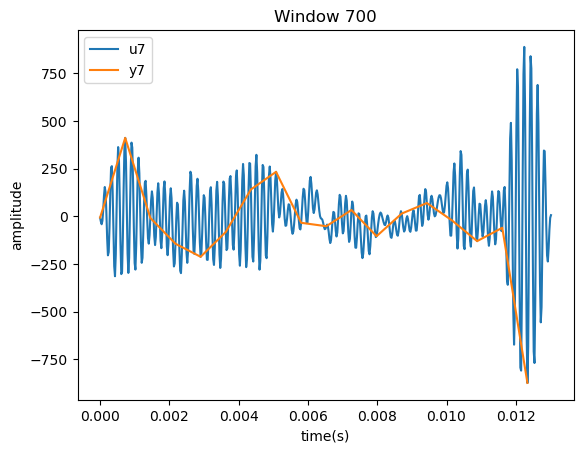

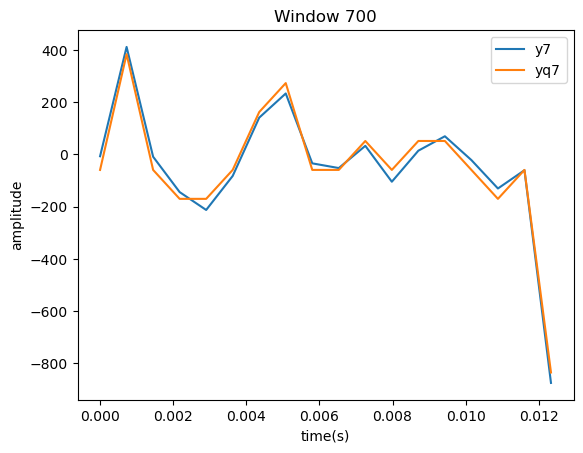

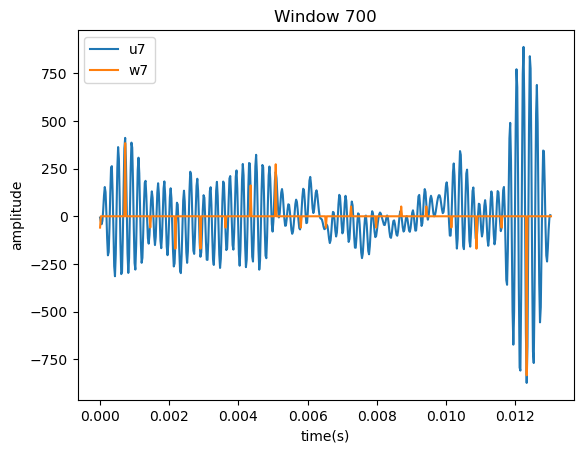

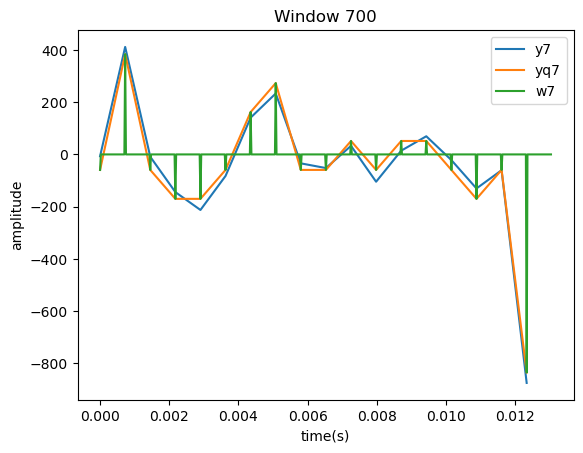

In [68]:
xr2 = []
for win in range(Nx):
    xwinr = compress2(x[win], h, g, Tg[win], M, win)
    xr2.append(xwinr)
xr2 = np.array(xr2)

Overlap Add for 2nd case

The compression rate using the non-adaptive compressor is 0.5
The MSE using the non-adaptive compressor is 3637.973558578987


Text(0, 0.5, 'amplitude')

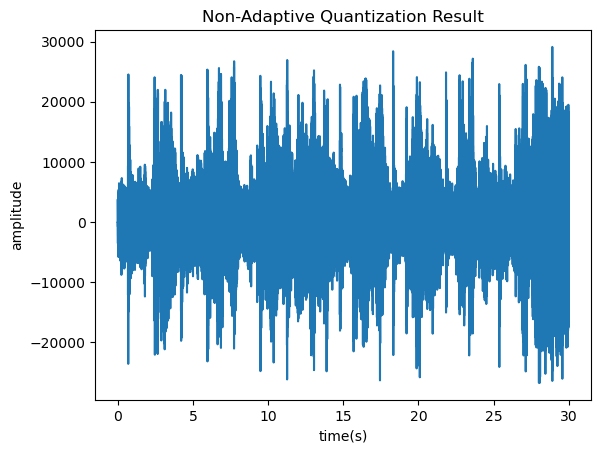

In [70]:
step = N
ola = len(xr2[0])
final2 = np.zeros(Nx*step+len(g[0])+len(h[0]), dtype=np.int16)
for win in range(Nx):
    final2[win*step:win*step+ola] += xr2[win]
final2.astype(np.int16)
bits_final2 = Nx * step * 8
print("The compression rate using the non-adaptive compressor is",compr_rate(bits_initial, bits_final2))
#MSE
start = 63
end = start+len(signal)
mse2 = np.mean((final2[start:end]-signal)**2)
print("The MSE using the non-adaptive compressor is",mse2)
plotter(final2, fs)
plt.title("Non-Adaptive Quantization Result")
plt.xlabel('time(s)')
plt.ylabel('amplitude')

Text(0, 0.5, 'amplitude')

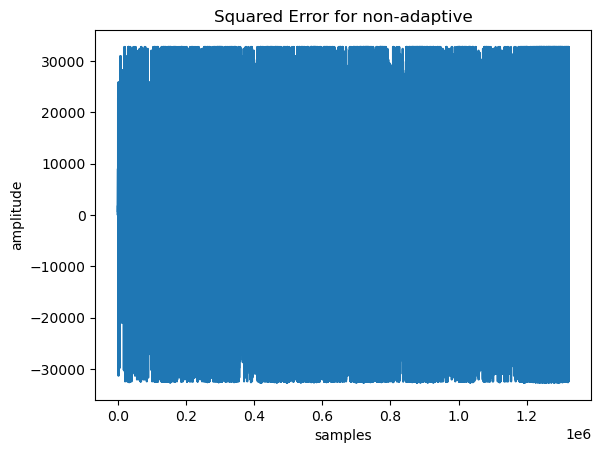

In [71]:
plt.plot((final2[start:end]-signal)**2)
plt.title('Squared Error for non-adaptive')
plt.xlabel('samples')
plt.ylabel('amplitude')

Text(0, 0.5, 'amplitude')

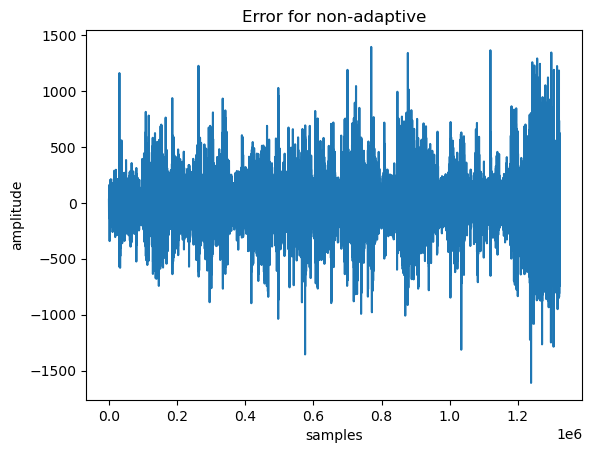

In [72]:
plt.plot(final2[start:end]-signal)
plt.title('Error for non-adaptive')
plt.xlabel('samples')
plt.ylabel('amplitude')

In [73]:
sp.io.wavfile.write("reconstructed_2.wav", fs, final2)


Plot of final signals 

Text(0.5, 1.0, 'Window 700')

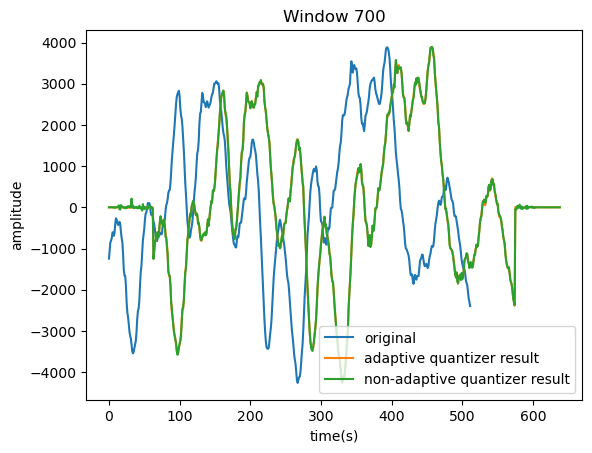

In [108]:
w = 700
plt.plot(x[w], label = 'original')
plt.plot(xr1[w], label = 'adaptive quantizer result')
plt.plot(xr2[w], label = 'non-adaptive quantizer result')
plt.legend()
plt.xlabel('time(s)')
plt.ylabel('amplitude')
plt.title('Window 700')

In [76]:

    ipd.Audio(data = final2, rate = fs)

In [77]:
ipd.Audio(data = final1, rate = fs)